<a href="https://colab.research.google.com/github/FredPedrosa/onset_detection/blob/main/onset_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [12]:
# Instala a biblioteca yt-dlp, que é a mais robusta para baixar do YouTube
!pip install yt-dlp

In [17]:
import yt_dlp
import os
from google.colab import files

# UPLOAD DO ARQUIVO DE COOKIES
uploaded = files.upload()

if 'cookies.txt' not in uploaded:
    print("\n ERRO: O arquivo 'cookies.txt' não foi encontrado. Tente novamente.")
else:
    print("\n Arquivo 'cookies.txt' carregado com sucesso!")

    # --- LINK DO ARQUIVO ---
    youtube_url = "https://www.youtube.com/watch?v=dgjMVJ_EuCw"
    # Garante que o nome do arquivo termine com .wav
    output_template = '%(title)s.wav'

    # --- CONFIGURAÇÃO DO YT-DLP COM OS COOKIES E CONVERSÃO PARA WAV ---
    ydl_opts = {
        'format': 'bestaudio/best',
        'postprocessors': [{
            'key': 'FFmpegExtractAudio',
            'preferredcodec': 'wav',
        }],
        'outtmpl': output_template,
        'quiet': True,
        'cookiefile': 'cookies.txt',
    }

    # --- EXECUÇÃO DO DOWNLOAD ---
    try:
        print(f"\nBaixando e convertendo áudio para .wav: {youtube_url}")

        with yt_dlp.YoutubeDL(ydl_opts) as ydl:
            info = ydl.extract_info(youtube_url, download=True)
            filename = ydl.prepare_filename(info)

        print(f"\n Download concluído! O arquivo foi salvo como: '{filename}'")

        # DefinIR a variável para ser usada na próxima célula de análise
        audio_path = filename

    except Exception as e:
        print(f"\n Ocorreu um erro: {e}")

if os.path.exists('cookies.txt'):
    os.remove('cookies.txt')
    print("\nArquivo de cookies removido por segurança.")

Por favor, faça o upload do seu arquivo 'cookies.txt'


Saving cookies.txt to cookies.txt

✅ Arquivo 'cookies.txt' carregado com sucesso!

Baixando e convertendo áudio para .wav: https://www.youtube.com/watch?v=dgjMVJ_EuCw

✅ Download concluído! O arquivo foi salvo como: 'Carlos Bala faz um solo de bateria.wav'

Arquivo de cookies removido por segurança.


In [19]:
# Esta célula permanece a mesma...
def detect_drum_onsets_from_audio(audio_path):
    print("\n1. Carregando áudio com Librosa...")
    y, sr = librosa.load(audio_path, sr=None)
    print("2. Separando componentes percussivos (HPSS)...")
    y_percussive = librosa.effects.percussive(y)
    print("3. Detectando onsets no componente percussivo...")
    onset_env = librosa.onset.onset_strength(y=y_percussive, sr=sr, aggregate=np.median)
    onset_times = librosa.onset.onset_detect(onset_envelope=onset_env, sr=sr, units='time', backtrack=True)
    print(f"\n✅ Análise concluída! {len(onset_times)} onsets de bateria detectados.")
    return onset_times, y, y_percussive, sr, onset_env

onset_times, y, y_percussive, sr, onset_env = detect_drum_onsets_from_audio(audio_path)

print("\nTimestamps dos Onsets (em segundos):")
for i, t in enumerate(onset_times):
    print(f"  Onset {i+1:2d}: {t:.3f} s")


1. Carregando áudio com Librosa...
2. Separando componentes percussivos (HPSS)...
3. Detectando onsets no componente percussivo...

✅ Análise concluída! 210 onsets de bateria detectados.

Timestamps dos Onsets (em segundos):
  Onset  1: 1.845 s
  Onset  2: 1.888 s
  Onset  3: 2.005 s
  Onset  4: 2.187 s
  Onset  5: 2.357 s
  Onset  6: 2.475 s
  Onset  7: 2.677 s
  Onset  8: 2.848 s
  Onset  9: 2.987 s
  Onset 10: 3.136 s
  Onset 11: 3.307 s
  Onset 12: 3.499 s
  Onset 13: 3.648 s
  Onset 14: 3.840 s
  Onset 15: 3.979 s
  Onset 16: 4.139 s
  Onset 17: 4.331 s
  Onset 18: 4.437 s
  Onset 19: 4.651 s
  Onset 20: 4.800 s
  Onset 21: 4.992 s
  Onset 22: 5.109 s
  Onset 23: 5.248 s
  Onset 24: 5.365 s
  Onset 25: 5.579 s
  Onset 26: 5.696 s
  Onset 27: 5.803 s
  Onset 28: 5.920 s
  Onset 29: 6.027 s
  Onset 30: 6.133 s
  Onset 31: 6.251 s
  Onset 32: 6.357 s
  Onset 33: 6.485 s
  Onset 34: 6.592 s
  Onset 35: 6.709 s
  Onset 36: 6.848 s
  Onset 37: 6.965 s
  Onset 38: 7.189 s
  Onset 39: 7.

  plt.tight_layout()

  fig.canvas.print_figure(bytes_io, **kw)

  fig.canvas.print_figure(bytes_io, **kw)

  fig.canvas.print_figure(bytes_io, **kw)

  fig.canvas.print_figure(bytes_io, **kw)

  fig.canvas.print_figure(bytes_io, **kw)



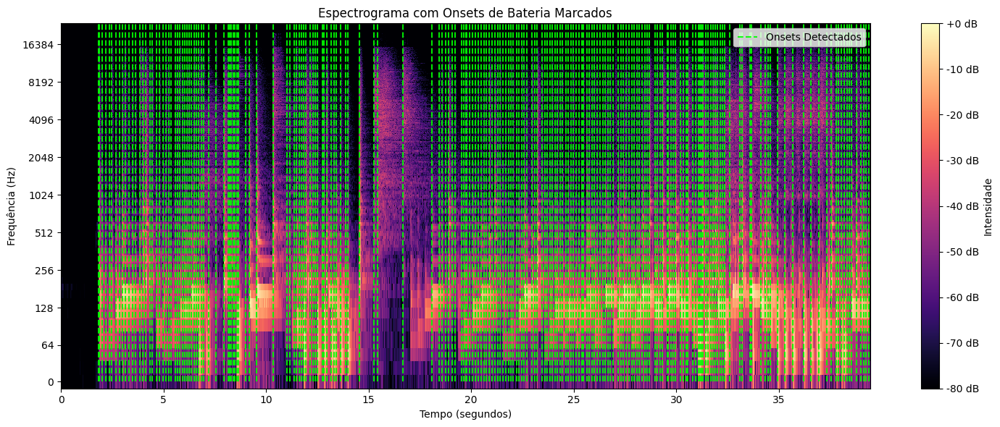

In [20]:
import matplotlib.pyplot as plt
import numpy as np
import librosa
import librosa.display

# --- 1. Calcular o Espectrograma ---
# STFT (Short-Time Fourier Transform) calcula a FFT em janelas de tempo
D = librosa.stft(y)
# Converte a amplitude para decibéis (dB), que é uma escala mais visual
DB = librosa.amplitude_to_db(np.abs(D), ref=np.max)


# --- 2. Criar a Visualização ---
fig, ax = plt.subplots(figsize=(15, 6))

# Plota o espectrograma
# y_axis='log' é melhor para visualizar frequências musicais
spec = librosa.display.specshow(DB, sr=sr, x_axis='time', y_axis='log', ax=ax)

# Adiciona as linhas verticais para cada onset detectado
# a cor 'lime' (verde limão) tem um bom contraste sobre o espectrograma
ax.vlines(onset_times, 0, sr / 2, color='lime', linestyle='--',
          alpha=0.9, linewidth=1.5, label='Onsets Detectados')

# --- 3. Melhorar o Gráfico ---
ax.set_title('Espectrograma com Onsets de Bateria Marcados')
ax.set_xlabel('Tempo (segundos)')
ax.set_ylabel('Frequência (Hz)')
ax.legend()
fig.colorbar(spec, ax=ax, format='%+2.0f dB', label='Intensidade')
plt.tight_layout()
plt.show()

In [21]:
import IPython.display as ipd

# Exibe o player de áudio diretamente no notebook
print(f"Tocando o áudio: {audio_path}")
ipd.Audio(audio_path, rate=sr)

Tocando o áudio: Carlos Bala faz um solo de bateria.wav
